In [1]:
import calendar
import cartopy.crs as ccrs
import cmocean as cmo
import numpy as np
import matplotlib.pyplot as plt
import os

In [2]:
HEM = 'sh'

In [3]:
root_dir = '/data/globus/jbassham/thesis-rough'

In [4]:
# Import regrid data (without mask or normalizing)

fnam = f'regrid/{HEM}/01072026_1643/motion_ppv4_latlon_{HEM}19922020_01072026_1643.npz'

data = np.load(os.path.join(root_dir, fnam))

ui = data['u']
vi = data['v']
ri = data['r']


In [5]:
# Import regrid data (without mask or normalizing)

fnam = f'regrid/{HEM}/01072026_1643/con_nimbus7_latlon_{HEM}19922020_01072026_1643.npz'

data = np.load(os.path.join(root_dir, fnam))

ci = data['ci']

In [6]:
# Import regrid data (without mask or normalizing)

fnam = f'regrid/{HEM}/01072026_1643/wind_jra55_latlon_{HEM}19922020_01072026_1643.npz'

data = np.load(os.path.join(root_dir, fnam))

ua = data['u']
va = data['v']

In [ ]:
# Load coordinates
fnam = f'coordinates/{HEM}/01072026_1643/coord_{HEM}19922020_01072026_1643.npz'

data = np.load(os.path.join(root_dir, fnam))
lat = data['lat']
lon = data['lon']

# Load time 
time = data['time']

In [8]:
# Define total land ocean mask where always nan over entire time series
total_nan_mask = (np.all(np.isnan(ui), axis = 0)) | (np.all(np.isnan(vi), axis = 0)) | (np.all(np.isnan(ci), axis = 0))

# Get dimensions 
nlat, nlon = np.shape(total_nan_mask)

# Initialize monthly nan mask 
monthly_nan_mask = np.full((12, nlat, nlon), np.nan)

# Get months from time variable
months = (time.astype('datetime64[M]').astype(int) % 12) + 1

# Fill monthly nan mask
for i in range(12):

    # Get month indices for current iteration
    month = months == (i + 1)

    # Assign month's mask
    monthly_nan_mask[i,:,:] = np.all(np.all(np.isnan(ui[month,:,:]), axis = 0)) | (np.all(np.isnan(vi[month,:,:]), axis = 0)) | (np.all(np.isnan(ci[month,:,:]), axis = 0))



In [9]:
def vartrue(true):

    truebar = np.nanmean(true, axis = 0)

    vartrue = np.nanmean((true - truebar) ** 2, axis = 0)

    return vartrue

In [10]:
def plot_metric(
    u_data, v_data, lon, lat, 
    metric_str, 
    cmap = cmo.cm.thermal, vmin = None, vmax = None, 
    l_title = 'Zonal', r_title = 'Meridioinal'):

    # Set longitude bounds for plot (full zonal coverage)
    lon_min = -180
    lon_max = 180

    # Set latitude bounds based on hemisphere
    if HEM == 'sh':
        lat_min = -90
        lat_max = -65
    elif HEM =='nh':
        lat_min = 65
        lat_max = 90

    # Define plot proection based on hempisphere
    if HEM == 'sh':
        projection = ccrs.SouthPolarStereo()
    elif HEM == 'nh':
        projection = ccrs.NorthPolarStereo()

    # Define data-to-plot's coordinate reference system
    # NOTE, used for 'crs' and 'transform' cartopy parameters
    crs = ccrs.PlateCarree()
    
    # Initialize subplots
    fig, axs = plt.subplots(
        nrows = 1,
        ncols = 2,
        figsize = (6,3),
        subplot_kw = {'projection': projection},
        constrained_layout = True
    )

    # Plot left plot; zonal evaluation
    axs[0].set_extent([lon_min, lon_max, lat_min, lat_max], crs = crs)
    axs[0].coastlines()
    # Plot pcolormesh plot
    pcm_0 = axs[0].pcolormesh(
        lon, lat, u_data,
        transform = crs,
        cmap = cmap, 
        vmin = vmin, vmax = vmax
    )
    axs[0].set_title(l_title)
    # Add colorbar
    plt.colorbar(pcm_0, ax = axs[0], orientation = 'vertical')

    # Plot right plot; meridional evaluation
    axs[1].set_extent([lon_min, lon_max, lat_min, lat_max], crs = crs)
    axs[1].coastlines()
    # Plot pcolormesh plot
    pcm_1 = axs[1].pcolormesh(
        lon, lat, v_data,
        transform = crs,
        cmap = cmap, 
        vmin = vmin, vmax = vmax
    )
    axs[1].set_title(r_title)
    # Add colorbar
    plt.colorbar(pcm_1, ax = axs[1], orientation = 'vertical')

    # Add title to plot
    fig.suptitle(f"{metric_str}", fontweight = 'bold')

    # Format with tight layout
    fig.tight_layout

    # Add text with means
    fig.text(0, -0.05, f"mean {l_title.lower()} {metric_str}: {np.nanmean(u_data):.4f}")
    fig.text(0.5, -0.05, f"mean {r_title.lower()} {metric_str}: {np.nanmean(v_data):.4f}")

    # # Define filemane for figure
    # fnam = f"{metric_str}_{MODEL_STR}_{TIMESTAMP_MODEL}.png"

    # # Save figure
    # plt.savefig(os.path.join(PATH_DEST, fnam), bbox_inches = 'tight')

    return

In [11]:
def plot_metric_month(data, lon, lat, metric_str, cmap = cmo.cm.thermal, vmin = None, vmax = None, cbar_label = None):

    # Set longitude bounds for plot (full zonal coverage)
    lon_min = -180
    lon_max = 180

    # Set latitude bounds based on hemisphere
    if HEM == 'sh':
        lat_min = -90
        lat_max = -65
    elif HEM =='nh':
        lat_min = 65
        lat_max = 90

    # Define plot proection based on hempisphere
    if HEM == 'sh':
        projection = ccrs.SouthPolarStereo()
    elif HEM == 'nh':
        projection = ccrs.NorthPolarStereo()

    # Define data-to-plot's coordinate reference system
    # NOTE, used for 'crs' and 'transform' cartopy parameters
    crs = ccrs.PlateCarree()
    
    # Initialize subplots
    fig, axs = plt.subplots(
        nrows = 2,
        ncols = 6,
        figsize = (18,6),
        subplot_kw = {'projection': projection},
        constrained_layout = True
    )

    # Flatten array to single Cartopy GeoAxes for iteration
    axs = axs.flatten()

    # Get month numbers from time variable
    months = (time.astype('datetime64[M]').astype(int) % 12) + 1

    for m in range(12):

        ax = axs[m]

        month_data = data[m]

        # Plot left plot; zonal evaluation
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs = crs)
        ax.coastlines()
        # Plot pcolormesh plot
        pcm = ax.pcolormesh(
            lon, lat, month_data,
            transform = crs,
            cmap = cmap, vmin = vmin, vmax = vmax
        )

        # Get month string for plot title
        month_string = calendar.month_name[m + 1]

        ax.set_title(f"{month_string}")

    # Add colorbar
    cbar = fig.colorbar(pcm, ax = axs, orientation='vertical', shrink=0.85)

    # Label colorbar
    if cbar_label is not None:
        cbar.set_label(cbar_label, fontsize = '14', fontweight = 'bold')

    # Add title to plot
    fig.suptitle(f"{metric_str}", fontweight = 'bold')

    # Format with tight layout
    fig.tight_layout

    # # Define filemane for figure
    # fnam = f"{metric_str}_{MODEL_STR}_{TIMESTAMP_OUT}.png"

    # # Save figure
    # plt.savefig(os.path.join(PATH_DEST, fnam), bbox_inches = 'tight')

    return

In [12]:
def plot_fcn_month(data, time, lon, lat, metric_fcn, metric_str, cmap = cmo.cm.thermal, vmin = None, vmax = None, cbar_label = None):

    """

    Computes and plots the given metric function for each month of the year
    Given inputs:
        y_pred: shaped [nt,2,nlat,nlon]; where y_pred[:,0,:,:] is the u component and y_pred[:,1,:,:] is the v component
        y_true: shaped [nt,2,nlat,nlon]; where y_true[:,0,:,:] is the u component and y_pred[:,1,:,:] is the v component
        lon: longitude
        lat: latitude
        metric_fcn: skill, weighted_skill, correlation, or weighted_correlation functions
        *metric_args and **metric_kwargs: attitional arguments for metric functions (ie: r for weighted)

    """

    # Get shape for spatial dimensions
    nt, nlat, nlon = np.shape(data)

    # Define number of month bins
    nm = 12 # number months

    # Initialize empty arrays containing metrics for each month of the year
    metric_allyear = np.full((nm, nlat, nlon), np.nan)

    # Get month numbers from time variable
    months = (time.astype('datetime64[M]').astype(int) % 12) + 1

    # # Create array of month strings for plot titles
    # month_strings = [calendar.month_name[m] for m in range(1,13)]

    for i in range(12):

        month = months == (i + 1)

        metric_month = metric_fcn(data[month,:,:])

        # Fill current month in year long array
        metric_allyear[i, :, :] = metric_month

    # Plot the u metrics for each month
    plot_metric_month(metric_allyear, lon, lat, f"{metric_str}", cbar_label = cbar_label)

    # Return arrays with metric for each month
    return metric_allyear

In [13]:
ui_var = vartrue(ui)
vi_var = vartrue(vi)

/tmp/ipykernel_2403658/1628904111.py:3: RuntimeWarning: Mean of empty slice
  truebar = np.nanmean(true, axis = 0)
/tmp/ipykernel_2403658/1628904111.py:5: RuntimeWarning: Mean of empty slice
  vartrue = np.nanmean((true - truebar) ** 2, axis = 0)


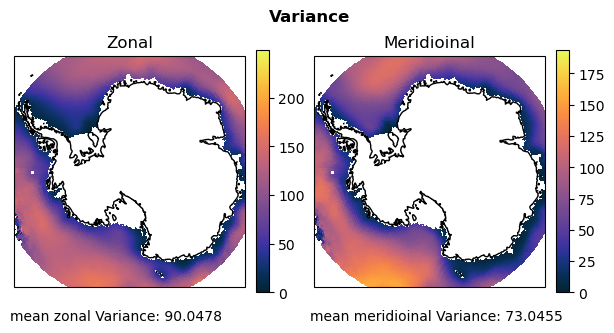

In [14]:
plot_metric(ui_var, vi_var, lon, lat, 'Variance')

/tmp/ipykernel_2403658/1628904111.py:3: RuntimeWarning: Mean of empty slice
  truebar = np.nanmean(true, axis = 0)
/tmp/ipykernel_2403658/1628904111.py:5: RuntimeWarning: Mean of empty slice
  vartrue = np.nanmean((true - truebar) ** 2, axis = 0)


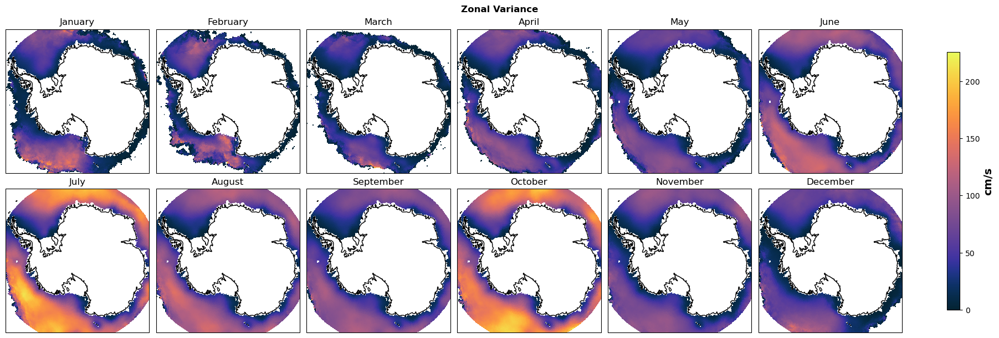

In [15]:
ui_var_monthly = plot_fcn_month(ui, time, lon, lat, vartrue, 'Zonal Variance', cbar_label = 'cm/s')

/tmp/ipykernel_2403658/1628904111.py:3: RuntimeWarning: Mean of empty slice
  truebar = np.nanmean(true, axis = 0)
/tmp/ipykernel_2403658/1628904111.py:5: RuntimeWarning: Mean of empty slice
  vartrue = np.nanmean((true - truebar) ** 2, axis = 0)


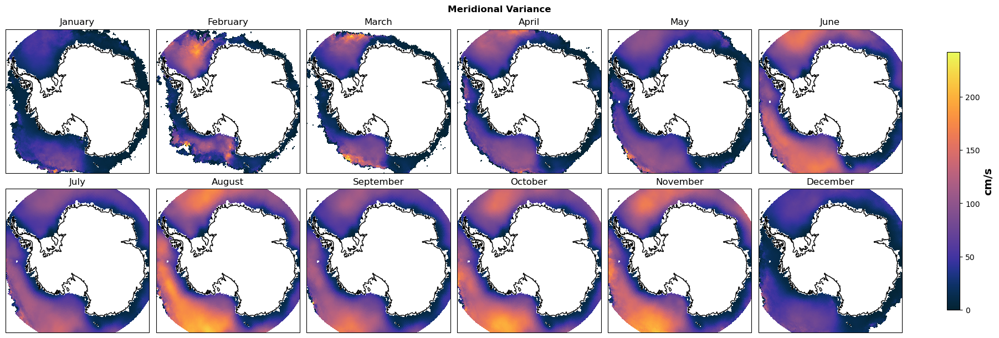

In [16]:
vi_var_monthly = plot_fcn_month(vi, time, lon, lat, vartrue, 'Meridional Variance', cbar_label = 'cm/s')

In [17]:
def r_avg(r):
    r_mean = np.nanmean(r, axis = 0)

    return r_mean

In [18]:
def r_max(r):
    r_max = np.nanmax(r, axis = 0)

    return r_max

In [19]:
def r_min(r):
    r_min = np.nanmin(r, axis = 0)

    return r_min

In [20]:
def r_spread(r):
    r_spread = r_max(r) - r_min(r)

    return(r_spread)

/tmp/ipykernel_2403658/627017965.py:2: RuntimeWarning: Mean of empty slice
  r_mean = np.nanmean(r, axis = 0)


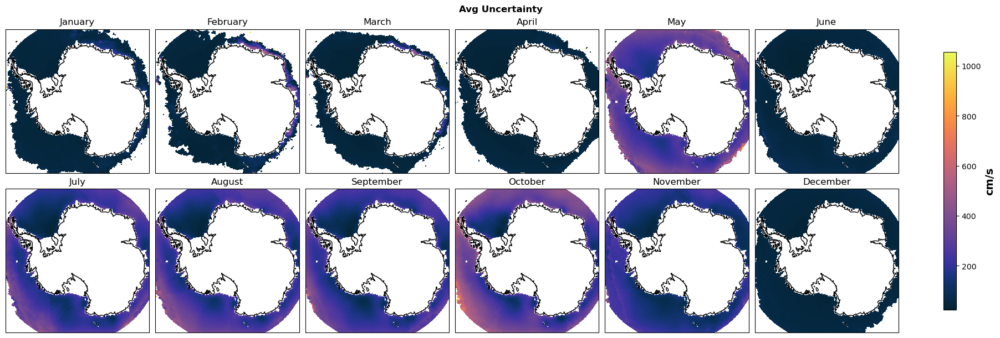

In [21]:
ri_avg_monthly = plot_fcn_month(ri, time, lon, lat, r_avg, 'Avg Uncertainty', cbar_label = 'cm/s')

/tmp/ipykernel_2403658/1628904111.py:3: RuntimeWarning: Mean of empty slice
  truebar = np.nanmean(true, axis = 0)
/tmp/ipykernel_2403658/1628904111.py:5: RuntimeWarning: Mean of empty slice
  vartrue = np.nanmean((true - truebar) ** 2, axis = 0)


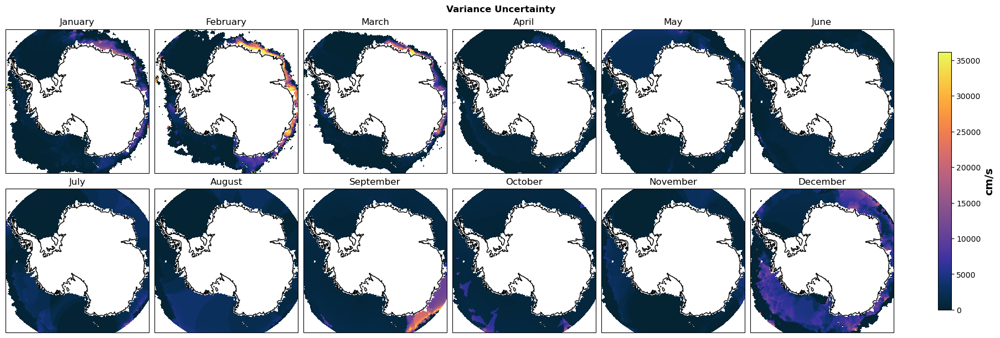

In [22]:
ri_var_monthly = plot_fcn_month(ri, time, lon, lat, vartrue, 'Variance Uncertainty', cbar_label = 'cm/s')

/tmp/ipykernel_2403658/3259030890.py:2: RuntimeWarning: All-NaN slice encountered
  r_max = np.nanmax(r, axis = 0)


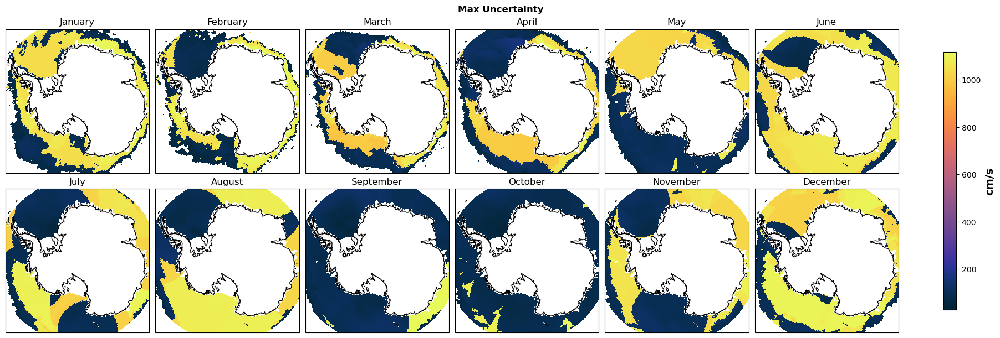

In [23]:
ri_max_monthly = plot_fcn_month(ri, time, lon, lat, r_max, 'Max Uncertainty', cbar_label = 'cm/s')

/tmp/ipykernel_2403658/3259030890.py:2: RuntimeWarning: All-NaN slice encountered
  r_max = np.nanmax(r, axis = 0)


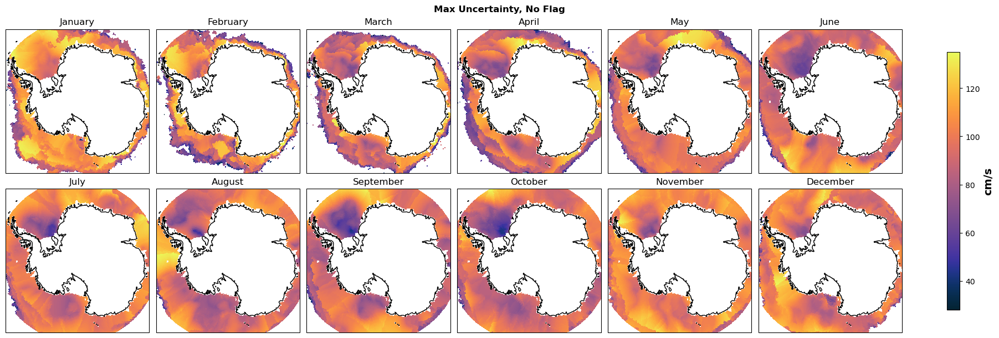

In [24]:
ri_no_flag = np.where(ri >= 1000, np.nan, ri)
ri_no_flag_max_monthly = plot_fcn_month(ri_no_flag, time, lon, lat, r_max, 'Max Uncertainty, No Flag', cbar_label = 'cm/s')

In [25]:
ri_flag = np.where(ri >= 1000, ri, 0)


In [26]:
def n_true_tdim(data):

    n_true = np.count_nonzero(data, axis = 0, keepdims = True)

    n_true = np.where(n_true == 0, np.nan, n_true)

    return n_true


array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       ...,

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan

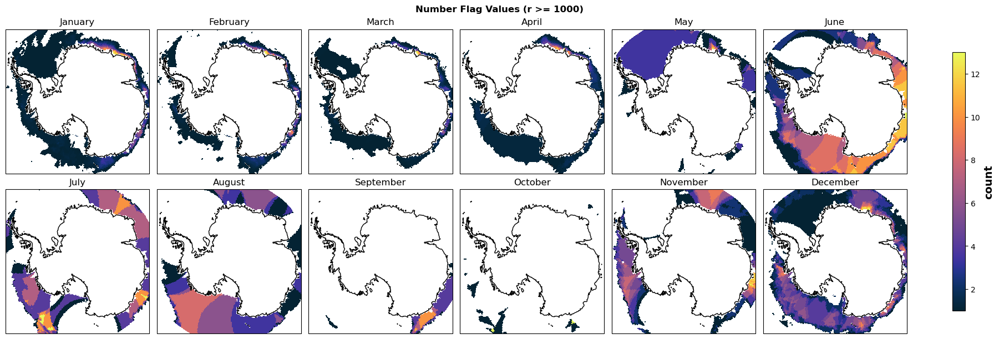

In [27]:
plot_fcn_month(ri_flag, time, lon, lat, n_true_tdim, 'Number Flag Values (r >= 1000)', cbar_label = 'count')

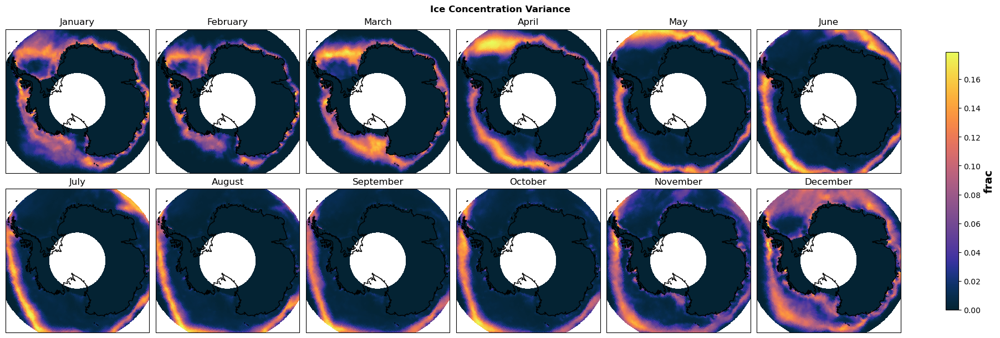

In [28]:
ci_var_monthly = plot_fcn_month(ci, time, lon, lat, vartrue, 'Ice Concentration Variance', cbar_label = 'frac')

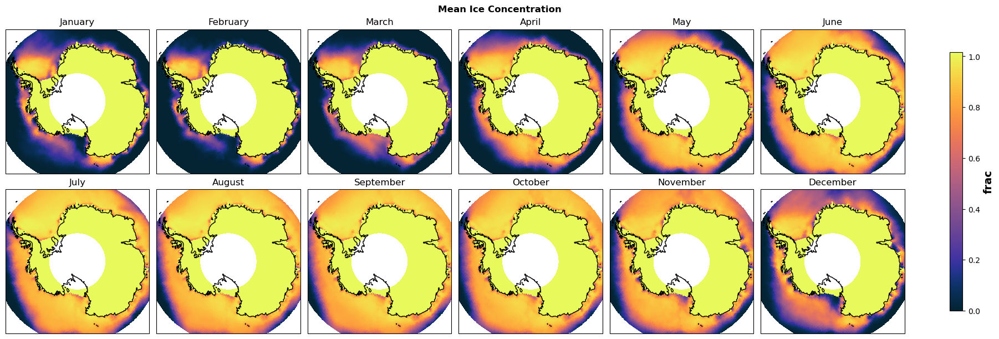

In [29]:
ci_mean_monthly = plot_fcn_month(ci, time, lon, lat, r_avg, 'Mean Ice Concentration', cbar_label = 'frac')

In [30]:
def n_days(data, param = 0):

    n_days = np.sum(data == param, axis = 0)

    n_days = np.where(np.all(np.isnan(data), axis = 0), np.nan, n_days)

    return n_days

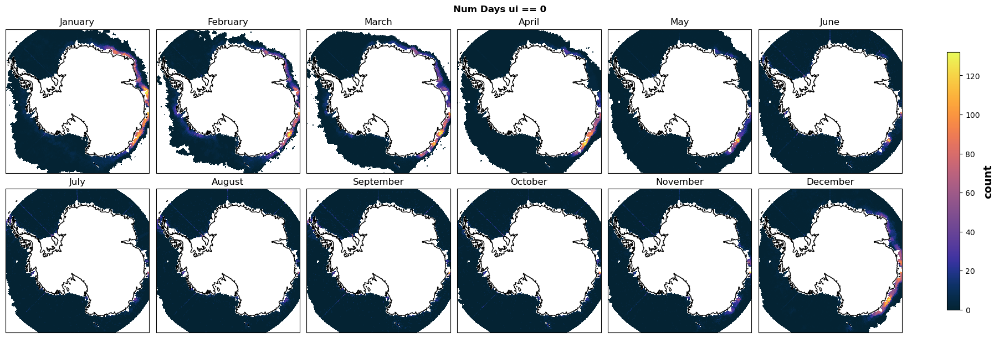

In [31]:
ui_n_zero_monthly = plot_fcn_month(ui, time, lon, lat, n_days, 'Num Days ui == 0', cbar_label = 'count')

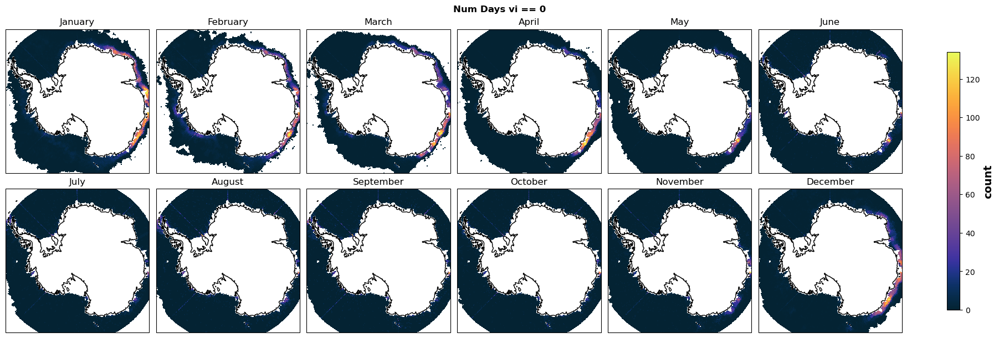

In [32]:
vi_n_zero_monthly = plot_fcn_month(vi, time, lon, lat, n_days, 'Num Days vi == 0', cbar_label = 'count')

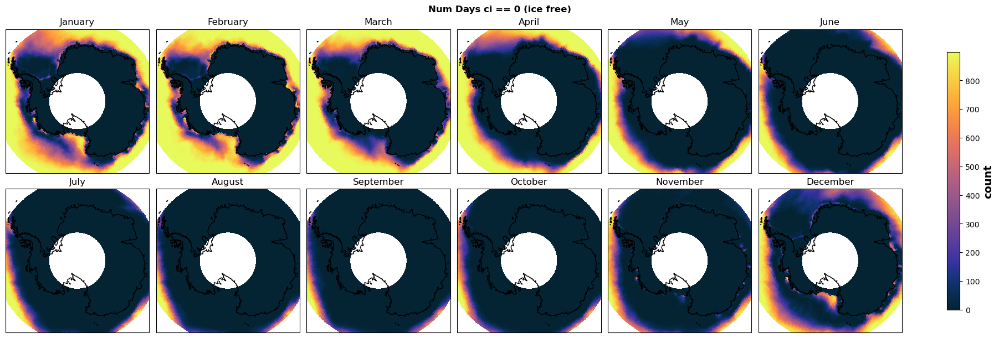

In [33]:
ci_n_zero_monthly = plot_fcn_month(ci, time, lon, lat, n_days, 'Num Days ci == 0 (ice free)', cbar_label = 'count')

In [34]:
# Get raw ice concentration values (IAW NSIDC) for masking
ci_raw = np.round(ci * 250)

# Mask based on NSIDC values
ci_mask = np.where((ci_raw == 251) | (ci_raw == 252) | (ci_raw == 253) | (ci_raw == 254), np.nan, ci)

/tmp/ipykernel_2403658/1272150167.py:2: RuntimeWarning: Mean of empty slice
  np.nanmean(ci_mask, axis = 0), np.nanmean(ci, axis = 0),


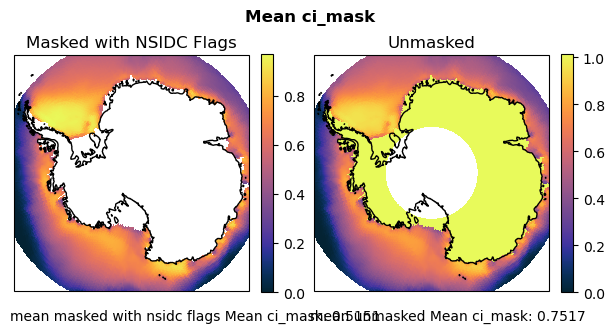

In [38]:
plot_metric(
    np.nanmean(ci_mask, axis = 0), np.nanmean(ci, axis = 0), 
    lon, lat, 
    'Mean ci_mask', 
    l_title = 'Masked with NSIDC Flags', r_title = 'Unmasked')

/tmp/ipykernel_2403658/1896885577.py:6: RuntimeWarning: Mean of empty slice
  plot_metric(np.nanmean(ci_mask_2, axis = 0), np.nanmean(ci_mask, axis = 0), lon, lat, f'Mean ci masked <= {thresh_ci} and NSIDC mask')


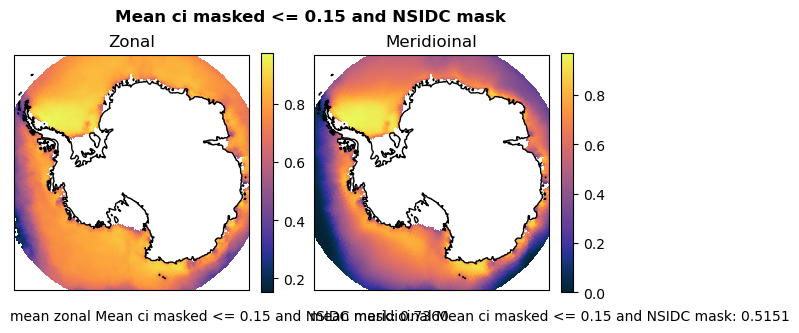

In [39]:
# Define minimum ice concentration threshold
thresh_ci = 0.15

ci_mask_2 = np.where(ci_mask <= thresh_ci, np.nan, ci_mask)

plot_metric(np.nanmean(ci_mask_2, axis = 0), np.nanmean(ci_mask, axis = 0), lon, lat, f'Mean ci masked <= {thresh_ci} and NSIDC mask')

/tmp/ipykernel_2403658/627017965.py:2: RuntimeWarning: Mean of empty slice
  r_mean = np.nanmean(r, axis = 0)


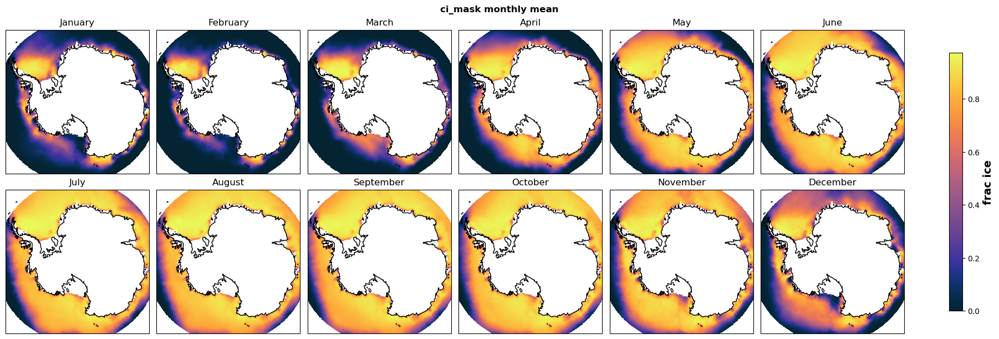

In [40]:
ci_mask_monthly = plot_fcn_month(ci_mask, time, lon, lat, r_avg, 'ci_mask monthly mean', cbar_label = 'frac ice')

/tmp/ipykernel_2403658/627017965.py:2: RuntimeWarning: Mean of empty slice
  r_mean = np.nanmean(r, axis = 0)


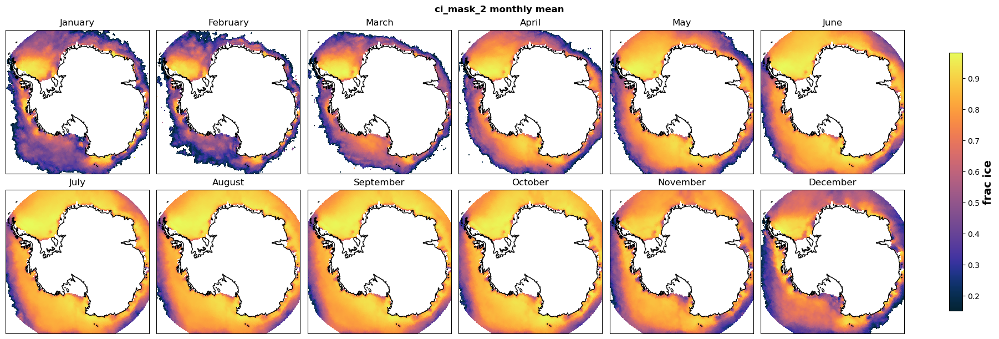

In [41]:
ci_mask_2_monthly = plot_fcn_month(ci_mask_2, time, lon, lat, r_avg, 'ci_mask_2 monthly mean', cbar_label = 'frac ice')

/tmp/ipykernel_2403658/627017965.py:2: RuntimeWarning: Mean of empty slice
  r_mean = np.nanmean(r, axis = 0)


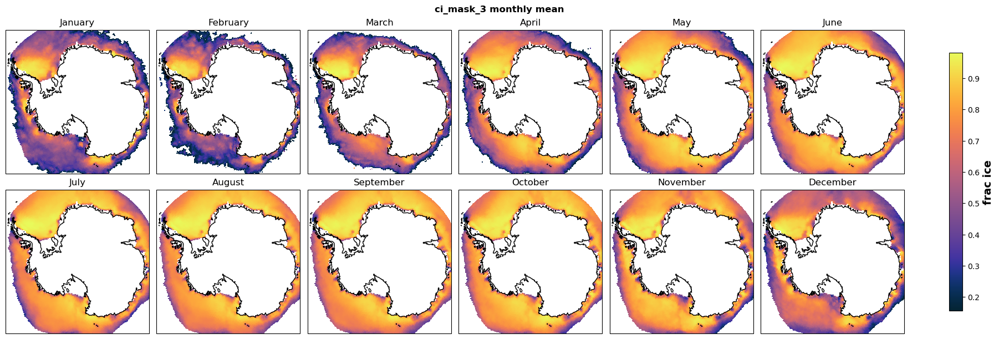

In [42]:
nt, _, _ = np.shape(ci)

# Assign threshold of percent ice free days for concentration masking
thresh_ice_free = .70 * nt # 80% of days

# Count number of days ice free at each spatial location
n_ice_free = np.sum(ci_mask <= 0.15, axis = 0)

# Create mask for ice free days above threshold
mask_ice_free = (n_ice_free > thresh_ice_free) | (ci_mask <= 0.15)

# Mask concentration based on threshold
ci_mask_3 = np.where(mask_ice_free, np.nan, ci_mask)

ci_mask_3_monthly = plot_fcn_month(ci_mask_3, time, lon, lat, r_avg, 'ci_mask_3 monthly mean', cbar_label = 'frac ice')

In [43]:
spatial_mask = n_ice_free > thresh_ice_free
ci_mask_4 = ci_mask.copy()
ci_mask_4[:, spatial_mask] = np.nan

/tmp/ipykernel_2403658/627017965.py:2: RuntimeWarning: Mean of empty slice
  r_mean = np.nanmean(r, axis = 0)


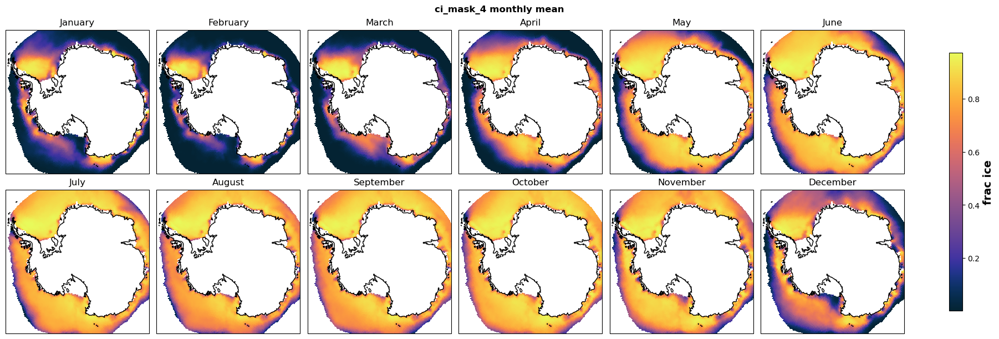

In [44]:
ci_mask_4_monthly = plot_fcn_month(ci_mask_4, time, lon, lat, r_avg, 'ci_mask_4 monthly mean', cbar_label = 'frac ice')

/tmp/ipykernel_2403658/627017965.py:2: RuntimeWarning: Mean of empty slice
  r_mean = np.nanmean(r, axis = 0)


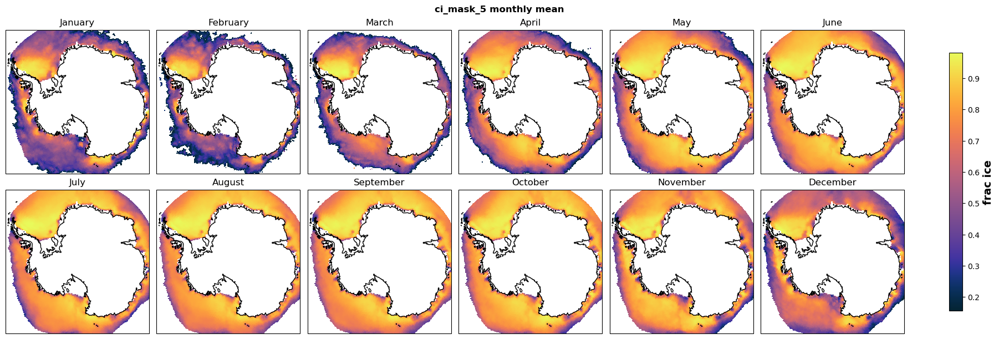

In [45]:
ci_mask_5 = np.where(ci_mask_4 <= 0.15, np.nan, ci_mask_4)
ci_mask_5_monthly = plot_fcn_month(ci_mask_5, time, lon, lat, r_avg, 'ci_mask_5 monthly mean', cbar_label = 'frac ice')

In [46]:
def count_days(data):
    return np.sum(data, axis = 0)

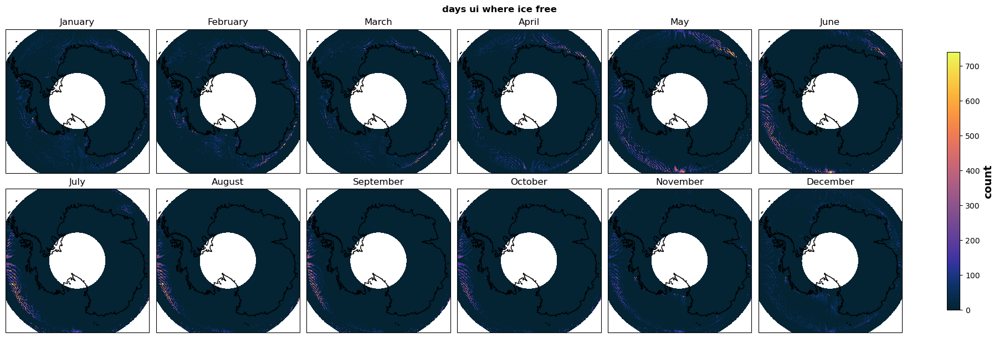

In [47]:
ui_condition = (~np.isnan(ui)) & (ci <= 0.15)

ui_noice_count_month = plot_fcn_month(ui_condition, time, lon, lat, count_days, 'days ui where ice free', cbar_label = 'count')

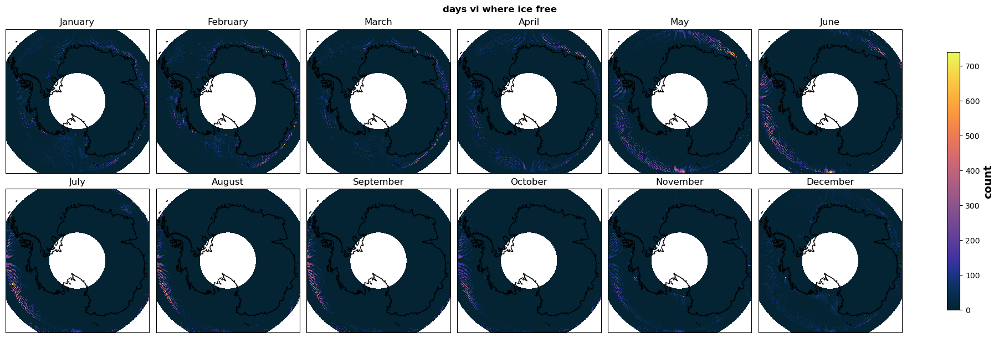

In [48]:
vi_condition = (~np.isnan(vi)) & (ci <= 0.15)

vi_noice_count_month = plot_fcn_month(vi_condition, time, lon, lat, count_days, 'days vi where ice free', cbar_label = 'count')

In [49]:
mask_final = (mask_ice_free) | (np.all(np.isnan(ui), axis = 0)) | (np.all(np.isnan(ui), axis = 0)) | (ui == 0) | (vi == 0)

print(np.shape(mask_final))

mask_count = count_days(mask_final)

print(np.shape(mask_count))

(10593, 81, 522)
(81, 522)


In [50]:
ci_final = np.where(mask_final, np.nan, ci_mask)

print(np.shape(ci_final))

mean_ci_final = np.nanmean(ci_final, axis = 0)

print(np.shape(mean_ci_final))

(10593, 81, 522)
(81, 522)


/tmp/ipykernel_2403658/1220042482.py:5: RuntimeWarning: Mean of empty slice
  mean_ci_final = np.nanmean(ci_final, axis = 0)


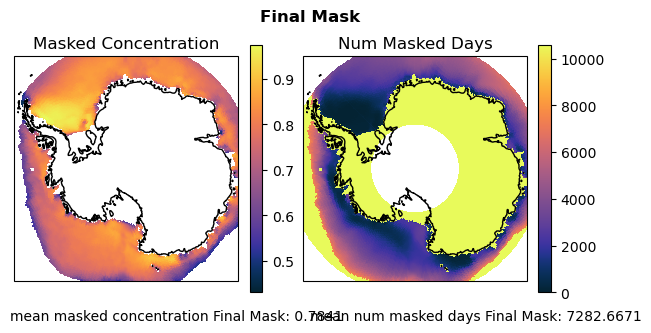

In [51]:
plot_metric(mean_ci_final, mask_count, lon, lat, 'Final Mask', l_title = 'Masked Concentration', r_title = 'Num Masked Days')

(10593, 81, 522)


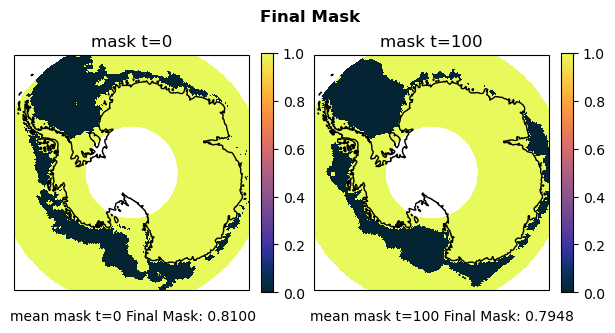

In [52]:
mask = np.isnan(ci_final)
print(np.shape(mask))

plot_metric(mask[0,:,:], mask[100,:,:], lon, lat, 'Final Mask', l_title = 'mask t=0', r_title = 'mask t=100')